# Spotify Artist Feature Collaboration Network

## TEAM MEMBERS: 
### NIMISH BHASU - PES2UG20CS479 - Section H
### RIA TREZA SERRAO - PES2UG20CS453 - Section G
### POOJA H - PES2UG20CS448 - Section G
### YOGITHA C SHEKHAR - PES2UG20CS399 - Section G

In [1]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import warnings
import pandas as pd
import numpy as np
import itertools
from tqdm import tqdm
from scipy import stats
import seaborn as sns
from scipy.sparse import csr_matrix
from scipy.optimize import curve_fit

In [2]:
collab_links = pd.read_csv("Collaboration_links_w_genre.csv")
collab_links.head()

,source,target,release_date,populairty
0,Robert Schumann,Vladimir Horowitz,1928,0
1,Frédéric Chopin,Vladimir Horowitz,1928,1
2,Felix Mendelssohn,Vladimir Horowitz,1928,0
3,Franz Liszt,Vladimir Horowitz,1928,0
4,Sergei Rachmaninoff,Vladimir Horowitz,1928,0


In [3]:
artist_info = pd.read_csv('artists_w_filtered_genres.csv')
artist_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12454 entries, 0 to 12453
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        12454 non-null  int64  
 1   artists           12454 non-null  object 
 2   acousticness      12454 non-null  float64
 3   danceability      12454 non-null  float64
 4   duration_ms       12454 non-null  float64
 5   energy            12454 non-null  float64
 6   instrumentalness  12454 non-null  float64
 7   liveness          12454 non-null  float64
 8   loudness          12454 non-null  float64
 9   speechiness       12454 non-null  float64
 10  tempo             12454 non-null  float64
 11  valence           12454 non-null  float64
 12  popularity        12454 non-null  float64
 13  key               12454 non-null  int64  
 14  mode              12454 non-null  int64  
 15  count             12454 non-null  int64  
 16  genres            12454 non-null  object

In [4]:
#total number of rows
collab_links.shape[0]

14860

In [5]:
# Create a directed graph
G = nx.DiGraph()

# Add edges to the graph
for i, row in collab_links.iterrows():
    source = row['source'].replace('$', '_')
    target = row['target'].replace('$', '_')
    G.add_edge(source, target)

# Set node attributes
node_attributes = {}
for i, row in collab_links.iterrows():
    source = row['source'].replace('$', '_')
    node_attributes[source] = {'release_date': row['release_date'],'populairty': row['populairty']}
G.add_nodes_from(node_attributes.items())

# Set node positions for visualization
pos = nx.spring_layout(G)

AttributeError: module 'scipy.sparse' has no attribute 'coo_array'

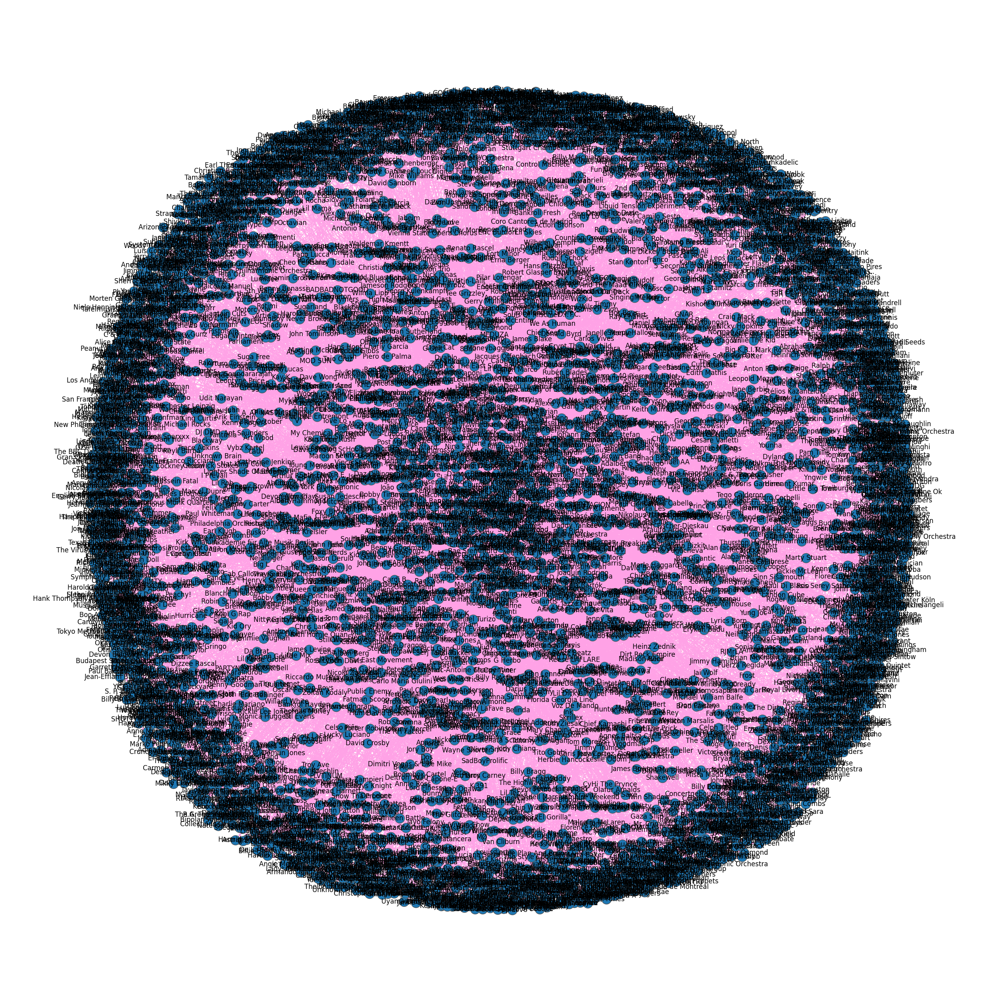

In [ ]:
# Ignore warning messages
warnings.filterwarnings("ignore")

#draw the graph
plt.figure(figsize=(25,25))
options = {'edge_color': '#ffa2e6', 'width': 1, 'with_labels': True, 'font_weight': 'regular'}

nx.draw(G, pos=nx.spring_layout(G, k=0.25, iterations=50), **options)
ax = plt.gca()
ax.collections[0].set_edgecolor("#555555") 
plt.show()

# Centrality measures

In [6]:
link = pd.read_csv('Collaboration_links_w_genre.csv') 
link

,source,target,release_date,populairty
0,Robert Schumann,Vladimir Horowitz,1928,0
1,Frédéric Chopin,Vladimir Horowitz,1928,1
2,Felix Mendelssohn,Vladimir Horowitz,1928,0
3,Franz Liszt,Vladimir Horowitz,1928,0
4,Sergei Rachmaninoff,Vladimir Horowitz,1928,0
...,...,...,...,...
14855,Lil Tjay,Sheff G,2020,67
14856,Lil Tjay,Sleepy Hallow,2020,67
14857,Meek Mill,Roddy Ricch,2020,66
14858,Kygo,Oh Wonder,2020,70


In [7]:
Graph_type = nx.Graph()
G = nx.from_pandas_edgelist(link, create_using=Graph_type)

In [8]:
frequency = nx.degree_histogram(G)
normalised_frequency= [x/sum(frequency) for x in frequency]
degrees = range(len(frequency))

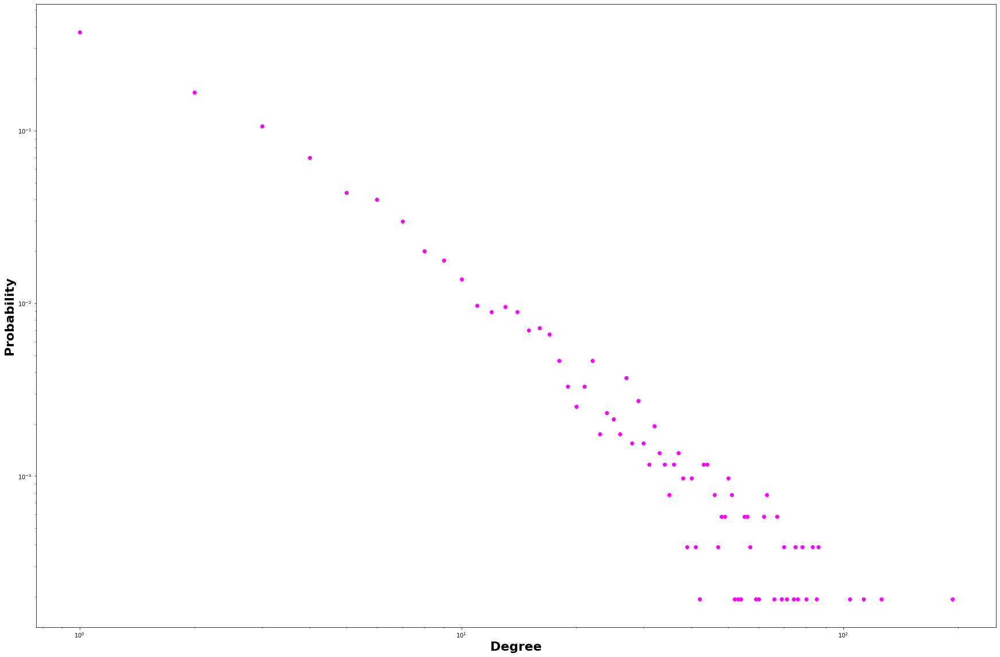

In [9]:
plt.figure(figsize=(30, 20)) 
plt.loglog(degrees, normalised_frequency,'o',color='magenta') 
plt.xlabel('Degree', fontweight='bold', fontsize=22)
plt.ylabel('Probability', fontweight='bold', fontsize=22)


plt.show()

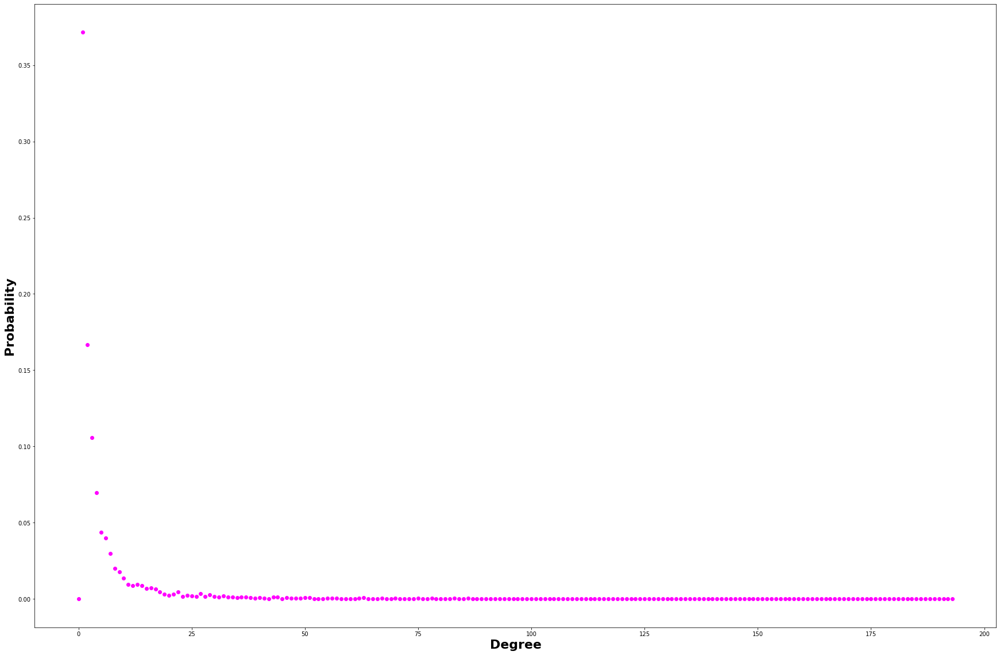

In [10]:
plt.figure(figsize=(30, 20)) 
plt.plot(degrees, normalised_frequency,'o', color='magenta') 
plt.xlabel('Degree',  fontweight='bold', fontsize=22)
plt.ylabel('Probability',  fontweight='bold', fontsize=22)


plt.show()

##  Fitting a power law function to the data

### The success of the curve_fit function depends on the quality and nature of your data, as well as the choice of function that you are fitting. If the data does not follow a power law or the function you are using is not a good fit for your data, the results may not be meaningful or accurate.

In [11]:
def func_powerlaw(x, m, c, c0):
    return c0 + (x**m) * c

pw = curve_fit(func_powerlaw, degrees, frequency, maxfev=2000 )
pw

(array([ 1.87429352e-01, -1.79891719e+02,  4.31564302e+02]),
 array([[ 6.17309719e-03,  9.21981431e+00, -9.68116126e+00],
        [ 9.21981431e+00,  1.44698777e+04, -1.60342773e+04],
        [-9.68116126e+00, -1.60342773e+04,  1.88333332e+04]]))

In [12]:
artist_info = pd.read_csv('artists_w_filtered_genres.csv')

In [13]:
artist_info_dict = dict()

for index, row in artist_info.iterrows():
    artist_info_dict[row['artists']] = dict()
    artist_info_dict[row['artists']]['popularity'] = row['popularity']
    artist_info_dict[row['artists']]['genre'] = row['filtered_genre']

In [14]:
degree_centrality_dict = nx.degree_centrality(G)
betweenness_centrality_dict = nx.betweenness_centrality(G)
eigenvector_centrality_dict = nx.eigenvector_centrality(G)

In [15]:
artist_list = list(degree_centrality_dict.keys())
deg_centrality_values = list(degree_centrality_dict.values())
betweeness_centrality_values = []
eigenvector_centrality_values = []
popularity_values = []

for artist in artist_list:
    betweeness_centrality_values.append(betweenness_centrality_dict[artist])
    eigenvector_centrality_values.append(eigenvector_centrality_dict[artist])
    popularity_values.append(artist_info_dict[artist]['popularity'])

KeyError: '8-Aug'

SpearmanrResult(correlation=-0.031566179716198885, pvalue=0.023601613249444233)

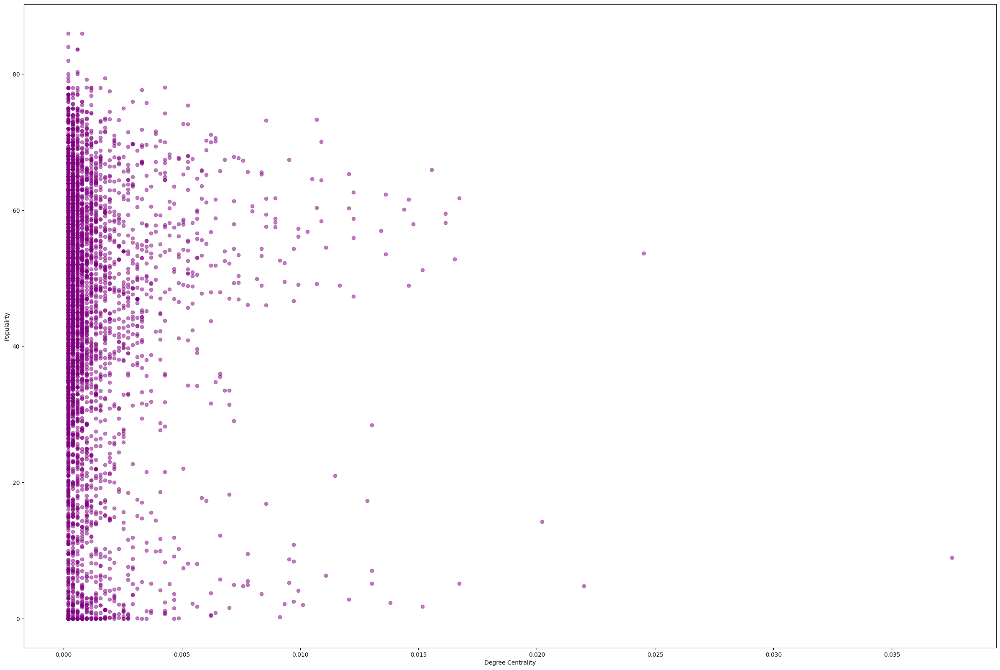

In [ ]:
plt.figure(figsize=(30, 20)) 
plt.scatter(deg_centrality_values,popularity_values,alpha=0.5,color='purple')
plt.xlabel('Degree Centrality')
plt.ylabel('Populairty')
stats.spearmanr(deg_centrality_values,popularity_values)

SpearmanrResult(correlation=-0.031566179716198885, pvalue=0.023601613249444233)

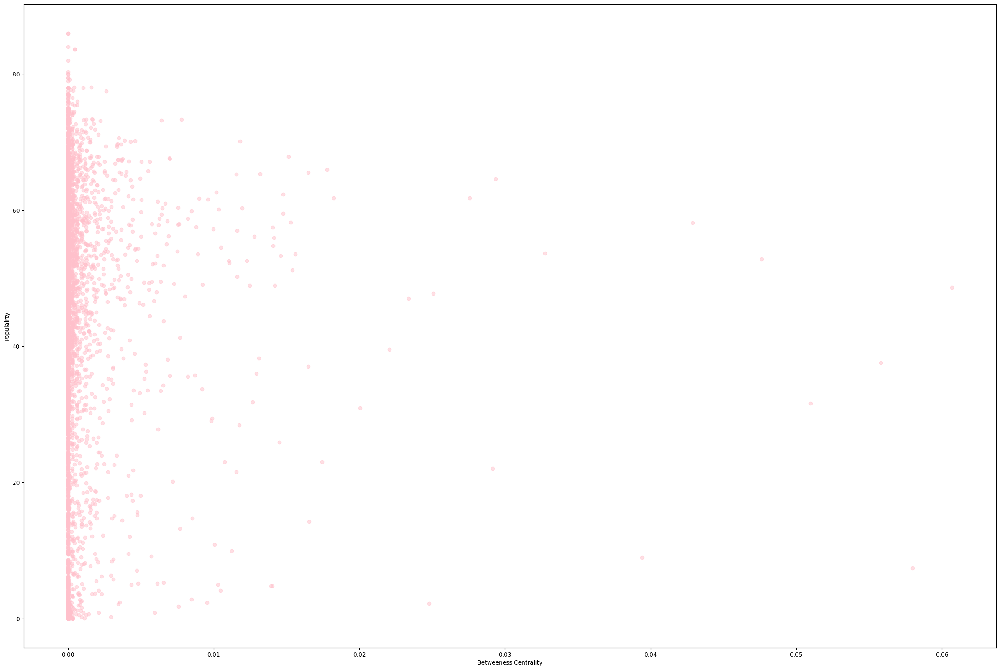

In [ ]:
plt.figure(figsize=(30, 20)) 
plt.scatter(betweeness_centrality_values,popularity_values,alpha=0.5,color='pink')
plt.xlabel('Betweeness Centrality')
plt.ylabel('Populairty')
stats.spearmanr(deg_centrality_values,popularity_values)

SpearmanrResult(correlation=-0.031566179716198885, pvalue=0.023601613249444233)

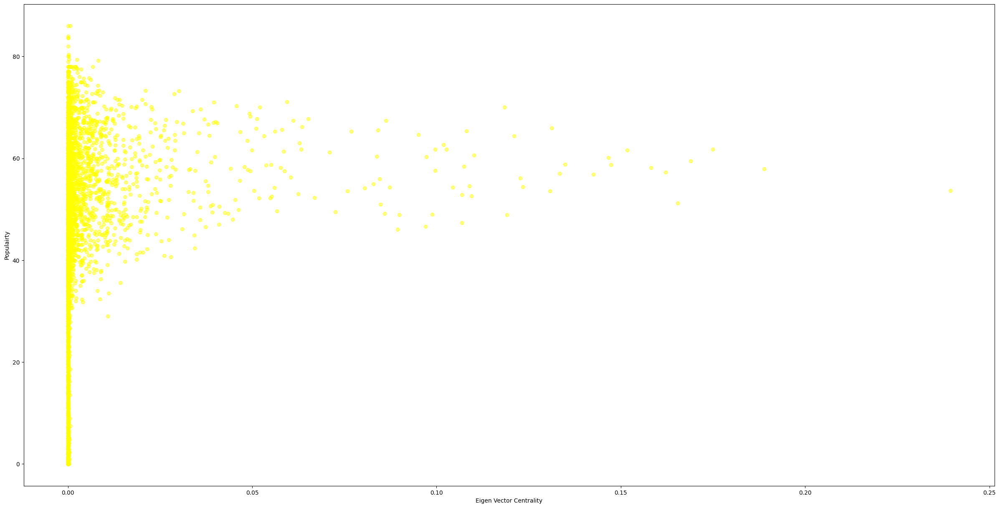

In [ ]:
plt.figure(figsize=(30, 15)) 
plt.scatter(eigenvector_centrality_values,popularity_values,alpha=0.5, color='yellow')
plt.xlabel('Eigen Vector Centrality')
plt.ylabel('Populairty')
stats.spearmanr(deg_centrality_values,popularity_values)

In [ ]:
artist_by_genre = pd.read_csv('data_w_genres.csv')

In [ ]:
artist_by_genre


,artists,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,mode,count,genres
0,"""Cats"" 1981 Original London Cast",0.575083,0.442750,247260.000000,0.386336,0.022717,0.287708,-14.205417,0.180675,115.983500,0.334433,38.000000,5,1,12,['show tunes']
1,"""Cats"" 1983 Broadway Cast",0.862538,0.441731,287280.000000,0.406808,0.081158,0.315215,-10.690000,0.176212,103.044154,0.268865,33.076923,5,1,26,[]
2,"""Fiddler On The Roof” Motion Picture Chorus",0.856571,0.348286,328920.000000,0.286571,0.024593,0.325786,-15.230714,0.118514,77.375857,0.354857,34.285714,0,1,7,[]
3,"""Fiddler On The Roof” Motion Picture Orchestra",0.884926,0.425074,262890.962963,0.245770,0.073587,0.275481,-15.639370,0.123200,88.667630,0.372030,34.444444,0,1,27,[]
4,"""Joseph And The Amazing Technicolor Dreamcoat""...",0.605444,0.437333,232428.111111,0.429333,0.037534,0.216111,-11.447222,0.086000,120.329667,0.458667,42.555556,11,1,9,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27616,鳳飛飛,0.884000,0.358000,259387.000000,0.208000,0.000002,0.150000,-9.524000,0.033900,131.261000,0.278000,35.000000,10,1,2,"['c-pop', 'classic mandopop', 'vintage chinese..."
27617,黃品源,0.541000,0.578000,293840.000000,0.334000,0.000006,0.067500,-11.974000,0.026700,135.934000,0.243000,47.000000,9,0,2,"['c-pop', 'classic cantopop', 'classic mandopop']"
27618,黃國隆,0.785455,0.570818,174582.727273,0.148400,0.000083,0.142191,-21.610091,0.054355,119.586273,0.741273,20.000000,5,1,11,[]
27619,黃蜀娟,0.925143,0.322262,212989.857143,0.141490,0.000189,0.196757,-19.256714,0.055571,111.685381,0.267033,23.000000,10,1,42,[]


In [ ]:
artist_by_genre.at[27616,'genres'].lower()

"['c-pop', 'classic mandopop', 'vintage chinese pop']"

In [ ]:
filtered_genre = []

for index, row in artist_by_genre.iterrows():
    if row['genres'] == '[]':
        filtered_genre.append(None)
    else:
        if 'country' in row['genres'].lower():
            filtered_genre.append('Country')
        elif 'electronic' in row['genres'].lower():
            filtered_genre.append('EDM')
        elif 'dance' in row['genres'].lower():
            filtered_genre.append('EDM')
        elif 'edm' in row['genres'].lower():
            filtered_genre.append('EDM')
        elif 'hip hop' in row['genres'].lower():
            filtered_genre.append('Hip-hop')
        elif 'indie' in row['genres'].lower():
            filtered_genre.append('Indie')
        elif 'jazz' in row['genres'].lower():
            filtered_genre.append('Jazz')
        elif 'pop' in row['genres'].lower():
            filtered_genre.append('Pop')
        elif 'metal' in row['genres'].lower():
            filtered_genre.append('Metal')
        elif 'old' in row['genres'].lower():
            filtered_genre.append('Oldies')
        elif 'rap' in row['genres'].lower():
            filtered_genre.append('Rap')
        elif 'rhythm and blues' in row['genres'].lower():
            filtered_genre.append('R&B')
        elif 'rock' in row['genres'].lower():
            filtered_genre.append('Rock')
        elif 'classical' in row['genres'].lower():
            filtered_genre.append('Classical')   
        else:
            filtered_genre.append(None)

In [ ]:
artist_by_genre['filtered_genre'] = filtered_genre

In [ ]:
artist_by_valid_genre = artist_by_genre.dropna(subset=['filtered_genre'])

In [ ]:
artist_by_valid_genre.to_csv('artists_w_filtered_genres.csv')

In [ ]:
print('NUMBER OF DISTINCT FILTERED GENRES: ', len(set(artist_by_valid_genre['filtered_genre'].tolist())))

NUMBER OF DISTINCT FILTERED GENRES:  12


In [ ]:
list_genres = artist_by_valid_genre['filtered_genre'].tolist()
distinct_genres = set(list_genres)
genre_artist_count_dict = dict()

for genre in distinct_genres:
    genre_artist_count_dict[genre] = list_genres.count(genre)

In [ ]:
genre_artist_count_dict_sorted = dict(sorted(genre_artist_count_dict.items(), reverse=True, key=lambda item: item[1]))

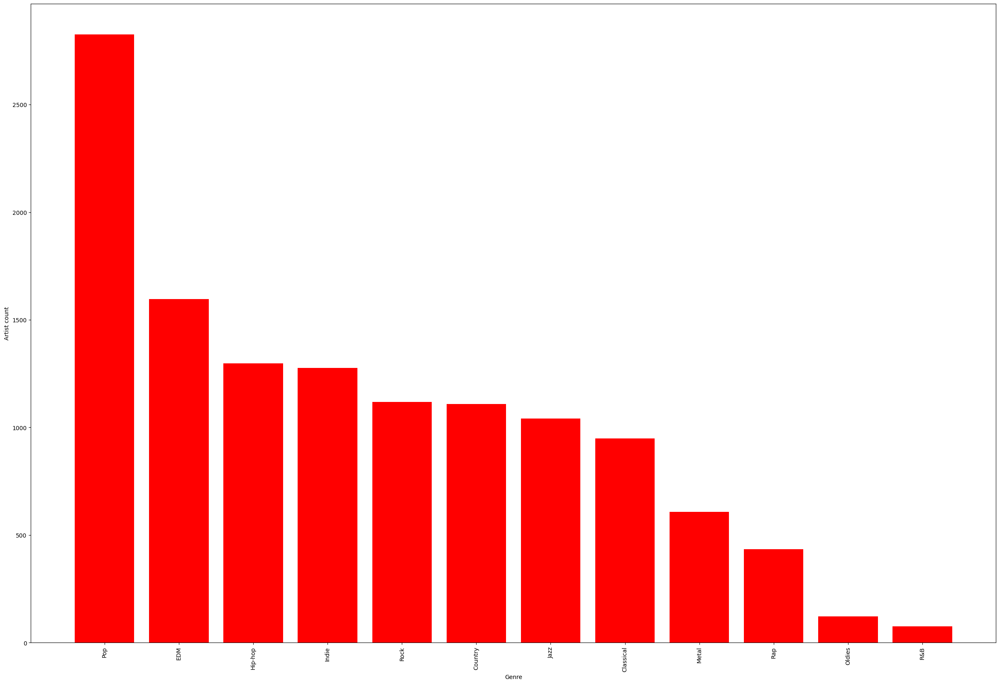

In [ ]:
plt.figure(figsize=(30,20))
plt.bar(list(genre_artist_count_dict_sorted.keys()), list(genre_artist_count_dict_sorted.values()),color='red')
plt.xticks(rotation='vertical')
plt.ylabel('Artist count')
plt.xlabel('Genre')
plt.show()

In [ ]:
!pip install gender_guesser

     -------------------------------------- 379.3/379.3 kB 6.0 MB/s eta 0:00:00



[notice] A new release of pip available: 22.3.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import gender_guesser.detector as gender

d = gender.Detector()
artist_node = pd.read_csv('Collaboration_nodes_w_genre.csv')

In [ ]:
artist_node = pd.read_csv('Collaboration_nodes_w_genre.csv')

In [ ]:
genderprediction_list = []

for index, row in artist_node.iterrows():
    prediction_successful = False
    predicted_gender_list = []
    for entries in row['Id'].split(' '):
        predicted_gender = d.get_gender(entries)
        if predicted_gender != 'unknown':
            if 'female' in predicted_gender:
                predicted_gender_list.append('female')
            elif 'male' in predicted_gender:
                predicted_gender_list.append('male')
            elif 'andy' in predicted_gender:
                predicted_gender_list.append('androgynous')
            prediction_successful = True

    if prediction_successful == True:
        genderprediction_list.append(predicted_gender_list[0])
    else:
        genderprediction_list.append('unknown')

In [ ]:
artist_node['gender'] = genderprediction_list
artist_node.to_csv('Collaboration_nodes_w_genre.csv')

In [ ]:
print('male artist counts: ', genderprediction_list.count('male'))
print('female artist counts: ', genderprediction_list.count('female'))
print('andy artist counts: ', genderprediction_list.count('androgynous'))
print('unknown artist counts: ', genderprediction_list.count('unknown'))

male artist counts:  2100
female artist counts:  996
andy artist counts:  149
unknown artist counts:  1897


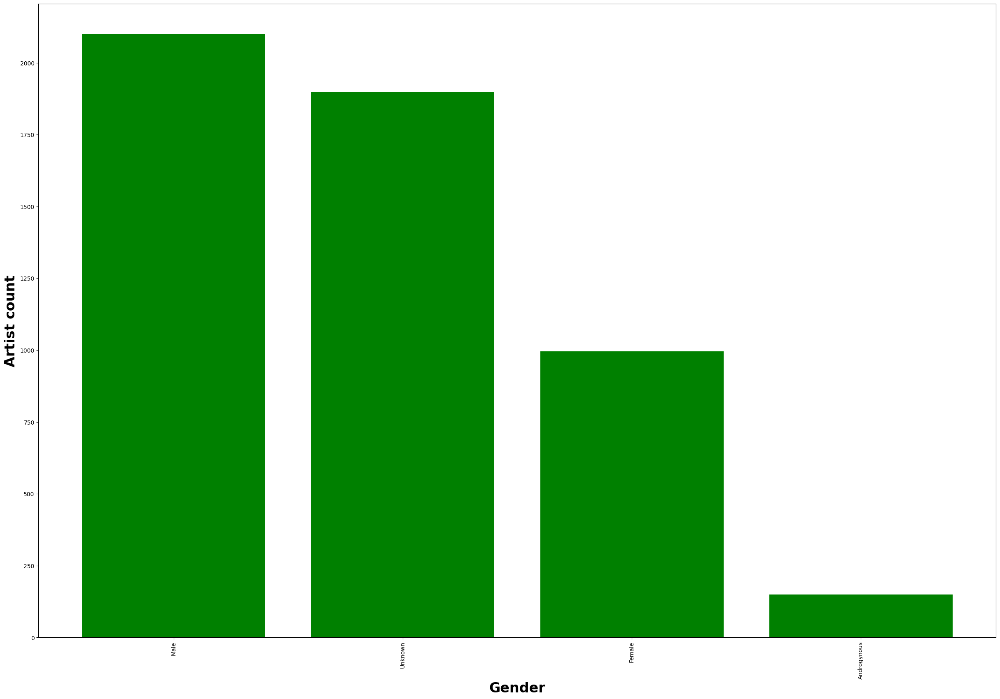

In [ ]:
plt.figure(figsize=(30,20))
plt.bar(['Male','Unknown','Female','Androgynous'], [2100,1897,996,149],color='green')

plt.xticks(rotation='vertical')
plt.ylabel('Artist count',fontweight='bold', fontsize=24)
plt.xlabel('Gender', fontweight='bold', fontsize=24)
plt.show()

In [ ]:
import networkx as nx
artist_link = pd.read_csv('Collaboration_links_w_genre.csv')
Graphtype = nx.Graph()
G = nx.from_pandas_edgelist(artist_link, create_using=Graphtype)

In [ ]:
artist_gender = pd.read_csv('Collaboration_nodes_w_genre.csv')

In [ ]:
male_artists = artist_gender[artist_gender['gender']=='male']['Id'].tolist()
female_artists = artist_gender[artist_gender['gender']=='female']['Id'].tolist()
unknown_artists = artist_gender[artist_gender['gender']=='unknown']['Id'].tolist()
andy_artists = artist_gender[artist_gender['gender']=='androgynous']['Id'].tolist()

In [ ]:
def links_node_groups(G,g1,g2):
    edges_list = [n for n in nx.edge_boundary(G,g1,g2)]
    return len(edges_list)

In [ ]:
print('Number of edges between male artists: ', links_node_groups(G,male_artists,male_artists))
print('Number of edges between male and female artists: ', links_node_groups(G,male_artists,female_artists))
print('Number of edges between female artists: ', links_node_groups(G,female_artists,female_artists))

Number of edges between male artists:  3089
Number of edges between male and female artists:  2114
Number of edges between female artists:  496


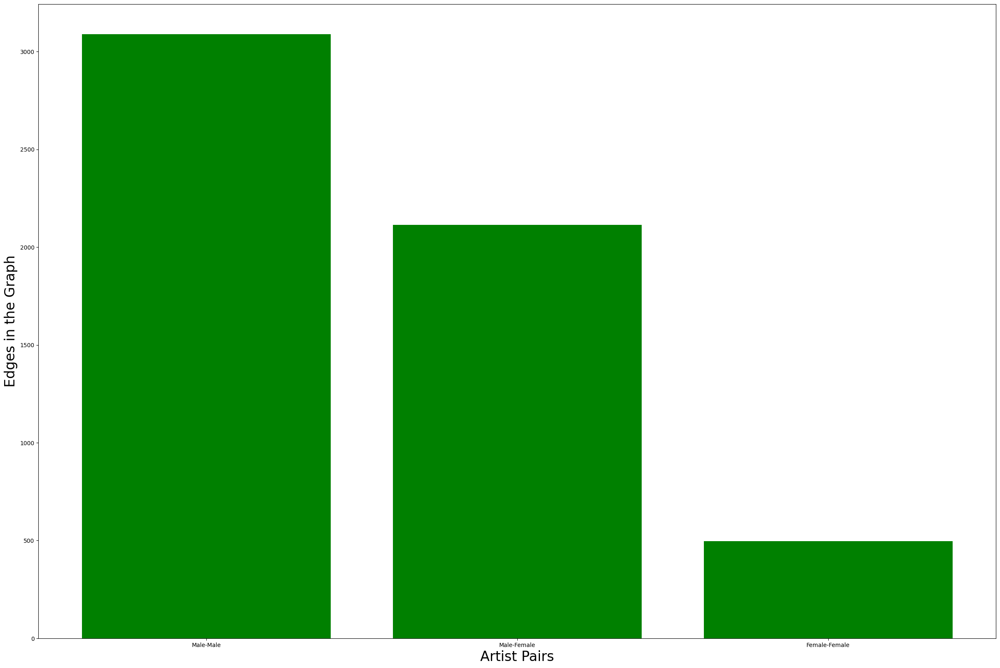

In [ ]:
plt.figure(figsize=(30, 20)) 
artists_groups = ['Male-Male','Male-Female','Female-Female']
group_link_counts = [links_node_groups(G,male_artists,male_artists),links_node_groups(G,male_artists,female_artists),links_node_groups(G,female_artists,female_artists)]
plt.bar(artists_groups,group_link_counts,color='green')
plt.xlabel('Artist Pairs',fontsize=24)
plt.ylabel('Edges in the Graph',fontsize=24)
plt.show()

In [ ]:
def fraction_links_node_groups(G,g1,g2):
    edges_list = [n for n in nx.edge_boundary(G,g1,g2)]
    return len(edges_list)/(len(g1)*len(g2))

In [ ]:
print('Fraction of edges between male artists: ', fraction_links_node_groups(G,male_artists,male_artists))
print('Fraction of edges between male and female artists: ', fraction_links_node_groups(G,male_artists,female_artists))
print('Fraction of edges between female artists: ', fraction_links_node_groups(G,female_artists,female_artists))
print('Fraction of edges between androgynous artists: ', fraction_links_node_groups(G,andy_artists,andy_artists))
print('Fraction of edges between male and androgynous artists: ', fraction_links_node_groups(G,male_artists,andy_artists))
print('Fraction of edges between female and androgynous artists: ', fraction_links_node_groups(G,andy_artists,female_artists))

Fraction of edges between male artists:  0.0007004535147392291
Fraction of edges between male and female artists:  0.0010107095046854083
Fraction of edges between female artists:  0.0004999919356139417
Fraction of edges between androgynous artists:  0.0009909463537678483
Fraction of edges between male and androgynous artists:  0.0010131032278683286
Fraction of edges between female and androgynous artists:  0.0010309695156464785


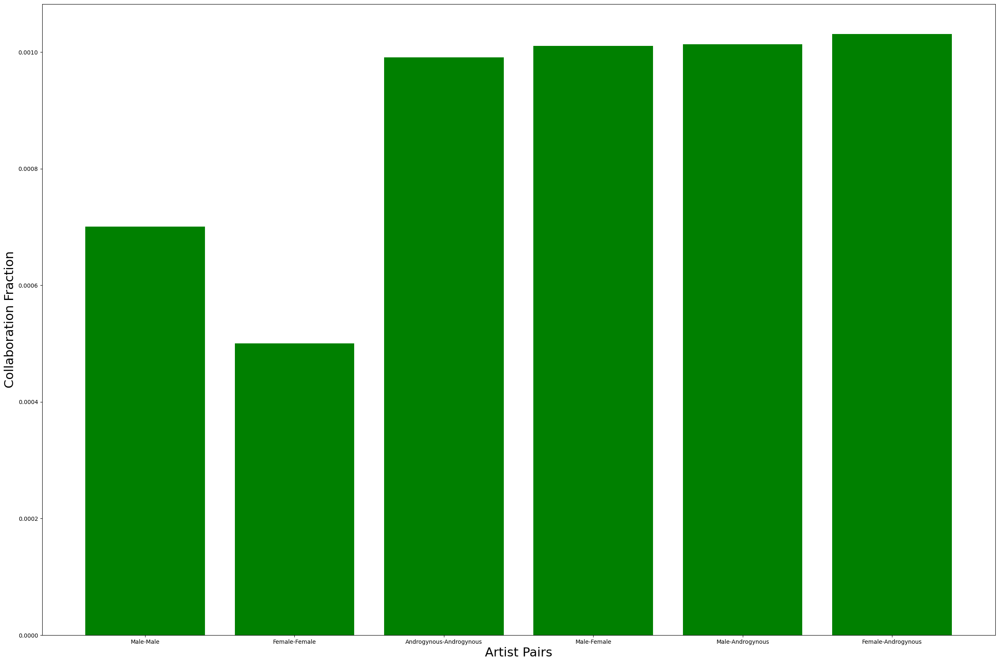

In [ ]:
plt.figure(figsize=(30, 20)) 
artists_groups = ['Male-Male','Female-Female','Androgynous-Androgynous','Male-Female','Male-Androgynous','Female-Androgynous']
group_link_counts = [fraction_links_node_groups(G,male_artists,male_artists),fraction_links_node_groups(G,female_artists,female_artists),fraction_links_node_groups(G,andy_artists,andy_artists),fraction_links_node_groups(G,male_artists,female_artists),fraction_links_node_groups(G,male_artists,andy_artists),fraction_links_node_groups(G,female_artists,andy_artists)]
plt.bar(artists_groups,group_link_counts,color='green')
plt.xlabel('Artist Pairs',fontsize=22)
plt.ylabel('Collaboration Fraction',fontsize=22)
plt.show()

In [ ]:
def assortativity_in_two_groups(G,main_node_group,neighboring_node_group):
    
    artist_degree_avg_neighbor_degree_dict = dict()
    degree_dict = dict(G.degree())

    for artist in main_node_group: 
            neighbors_of_artist = [n for n in G.neighbors(artist)]
            neighbor_degrees = []
            for neighbor in neighbors_of_artist:
                if neighbor in neighboring_node_group:
                    neighbor_degrees.append(degree_dict[neighbor])
                    
            if neighbor_degrees != []:
                artist_degree_avg_neighbor_degree_dict[artist] = dict()
                artist_degree_avg_neighbor_degree_dict[artist]['degree'] = degree_dict[artist]
                artist_degree_avg_neighbor_degree_dict[artist]['knn'] = np.mean(neighbor_degrees)
           
    degree_list = []
    knn_list = []

    for artist in artist_degree_avg_neighbor_degree_dict.keys():
        degree_list.append(artist_degree_avg_neighbor_degree_dict[artist]['degree'])
        knn_list.append(artist_degree_avg_neighbor_degree_dict[artist]['knn'])

    distinct_degrees = set(degree_list)
    distinct_degree_list = []
    distinct_knn_list = []

    for degree in distinct_degrees:
        indices = [i for i, x in enumerate(degree_list) if x == degree]
        knn_sublist = [knn_list[i] for i in indices]
        distinct_degree_list.append(degree)
        distinct_knn_list.append(np.mean(knn_sublist))


    plt.figure(figsize=(30, 20)) 
    bg = plt.axes()
    bg.set_facecolor("green")   

    a = np.asarray(distinct_degree_list, dtype=float)
    b = np.asarray(distinct_knn_list, dtype=float)
    logA = np.log10(a)
    logB = np.log10(b)
    coefficients = np.polyfit(logA, logB, 1)
    polynomial = np.poly1d(coefficients)
    ys = polynomial(logA)
    plt.loglog(a, b, 'o',color='red')
    plt.loglog(a, np.power(10, ys),color='orange')
    plt.xlabel('K')
    plt.ylabel('Knn(k)')
    plt.show()

    print('Correlation exponent and intercept: ', coefficients[0], coefficients[1])
    
    return

Degree correaltion among male artists


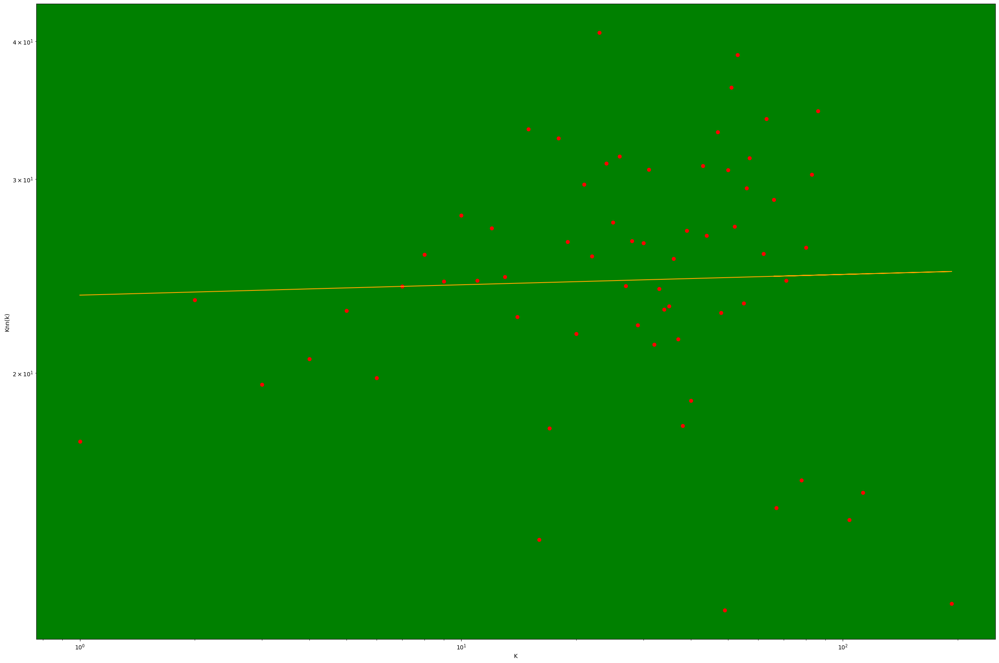

Correlation exponent and intercept:  0.0094050207457143 1.371714513964204
Degree correaltion among female artists


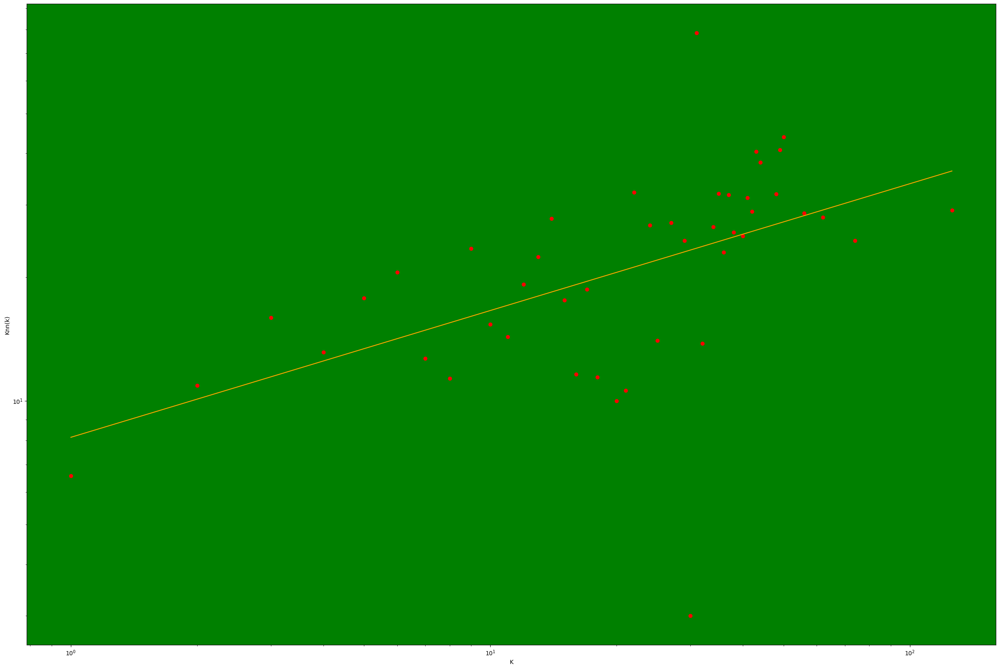

Correlation exponent and intercept:  0.3084186941703006 0.9112585201787188
Degree correaltion among androgynous artists


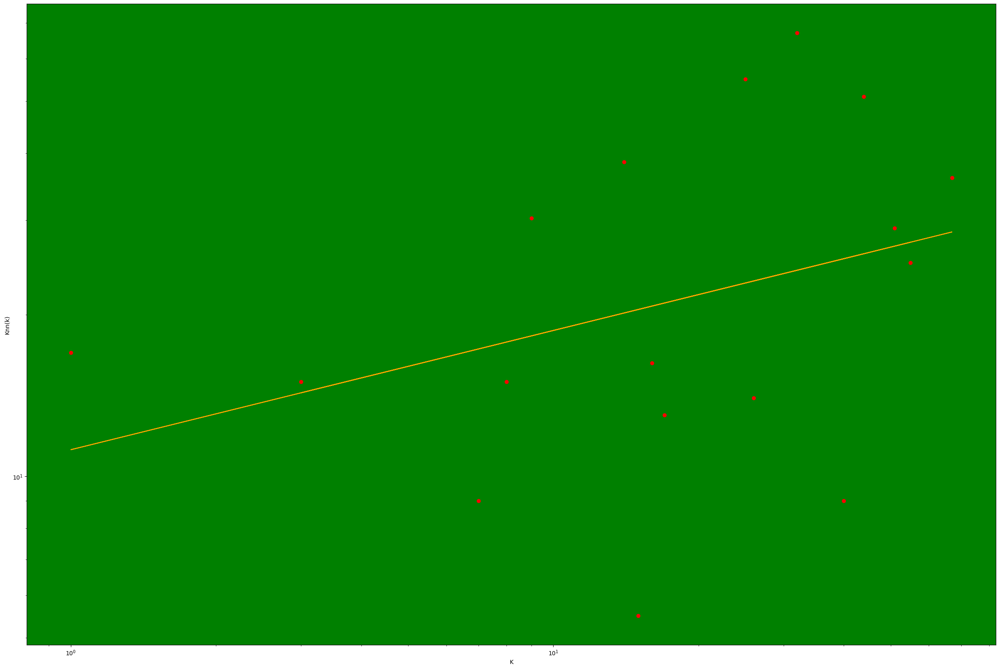

Correlation exponent and intercept:  0.22209566386373253 1.0497317540438682


In [ ]:
print('Degree correaltion among male artists')
assortativity_in_two_groups(G,male_artists,male_artists)

print('Degree correaltion among female artists')
assortativity_in_two_groups(G,female_artists,female_artists)

print('Degree correaltion among androgynous artists')
assortativity_in_two_groups(G,andy_artists,andy_artists)


Degree correaltion between male and female artists


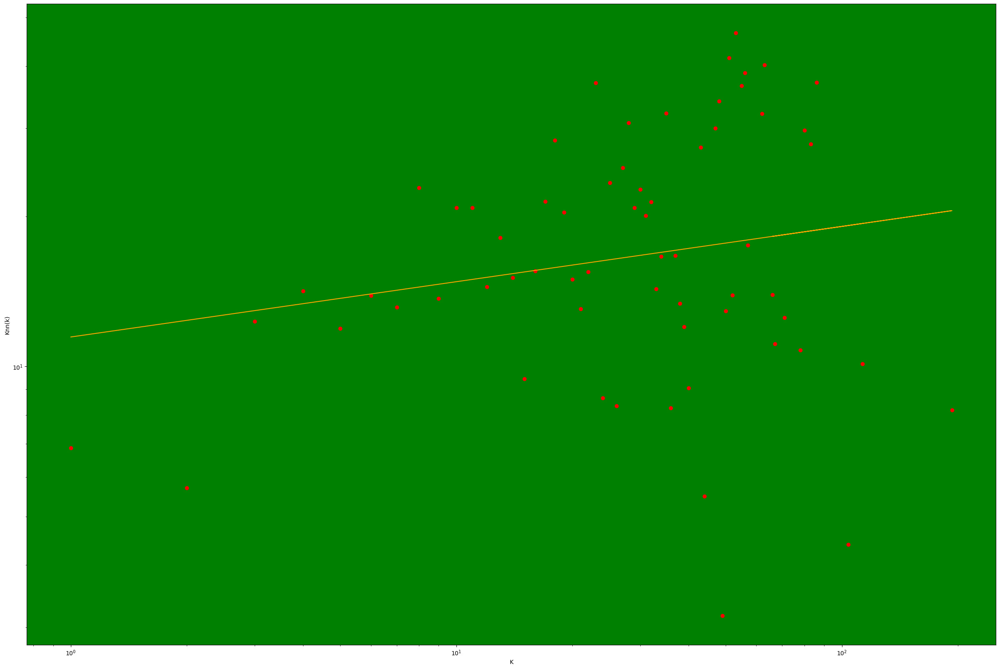

Correlation exponent and intercept:  0.11074867227621633 1.0592139887338723


In [ ]:

print('Degree correaltion between male and female artists')
assortativity_in_two_groups(G,male_artists,female_artists)



Degree correaltion between female and male artists


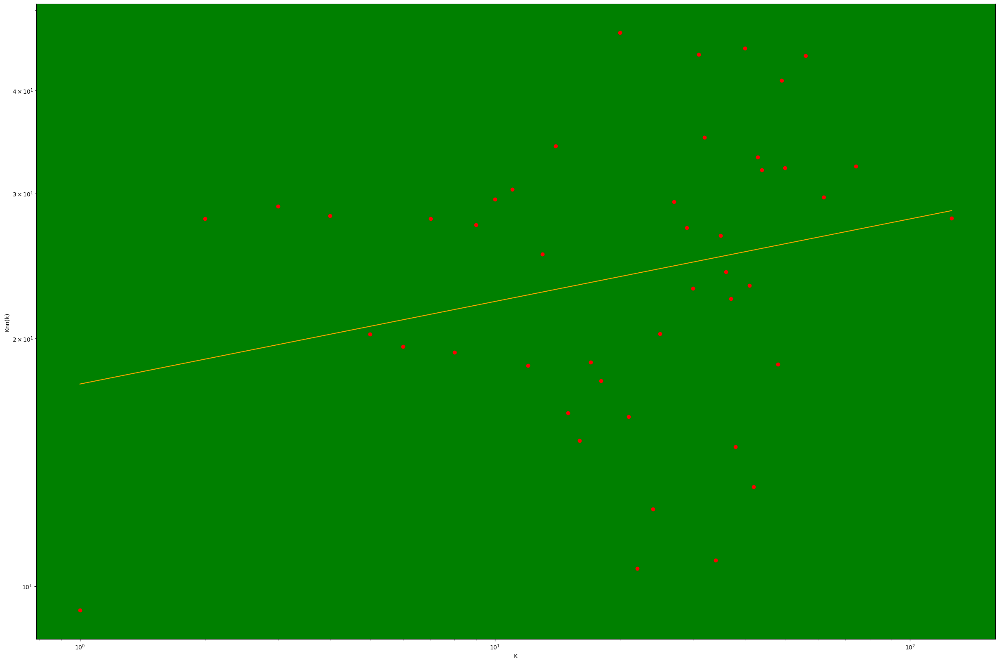

Correlation exponent and intercept:  0.10025413360049758 1.2454396367885918


In [ ]:
print('Degree correaltion between female and male artists')
assortativity_in_two_groups(G,female_artists,male_artists)


Degree correaltion between male and androgynous artists


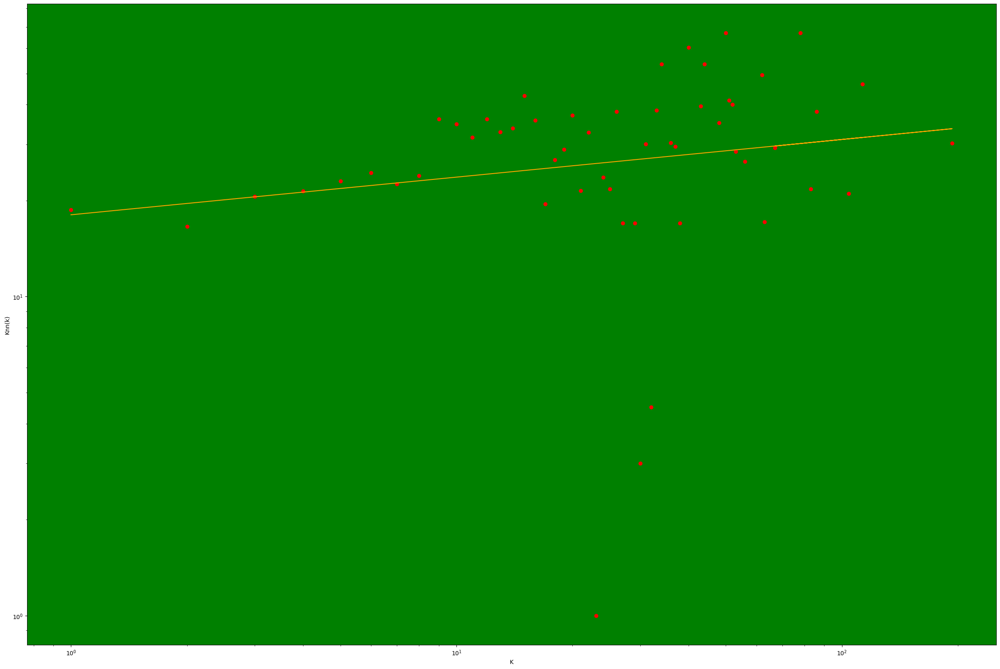

Correlation exponent and intercept:  0.11800842911257163 1.2563073204560218


In [ ]:
print('Degree correaltion between male and androgynous artists')
assortativity_in_two_groups(G,male_artists,andy_artists)


Degree correaltion between androgynous and male artists


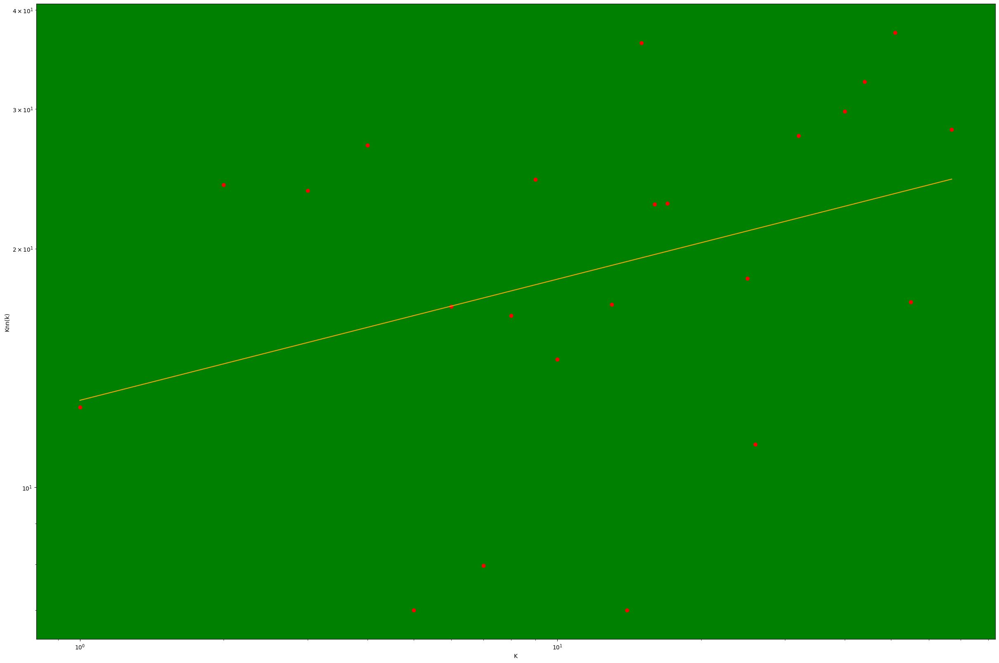

Correlation exponent and intercept:  0.15276308684558348 1.109835351614763


In [ ]:
print('Degree correaltion between androgynous and male artists')
assortativity_in_two_groups(G,andy_artists,male_artists)


Degree correaltion between female and androgynous artists


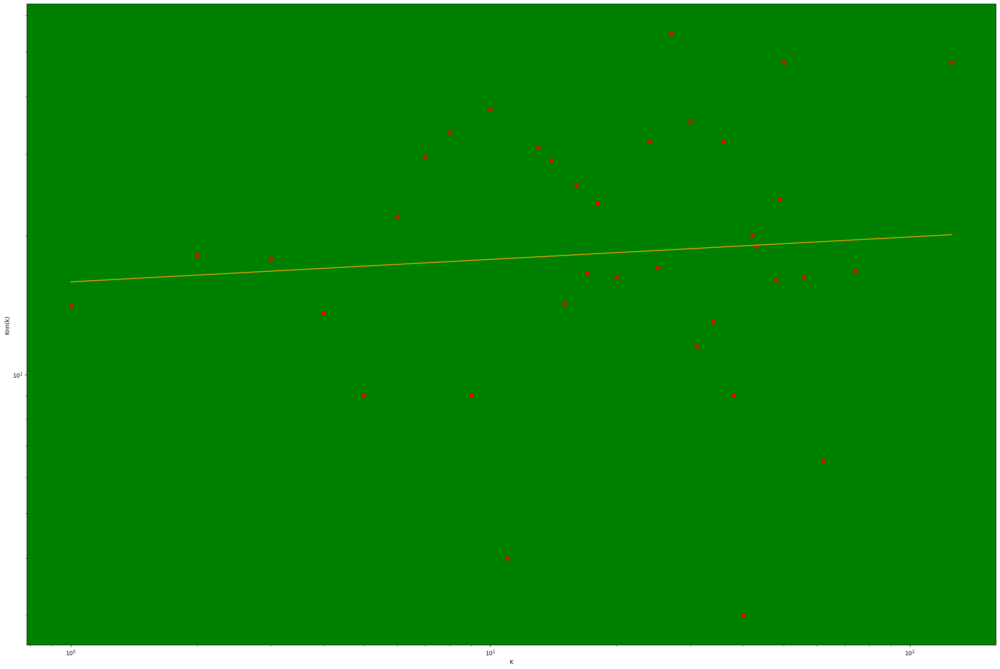

Correlation exponent and intercept:  0.048661587350921756 1.2008776751659713


In [ ]:
print('Degree correaltion between female and androgynous artists')
assortativity_in_two_groups(G,female_artists,andy_artists)


Degree correaltion between androgynous and female artists


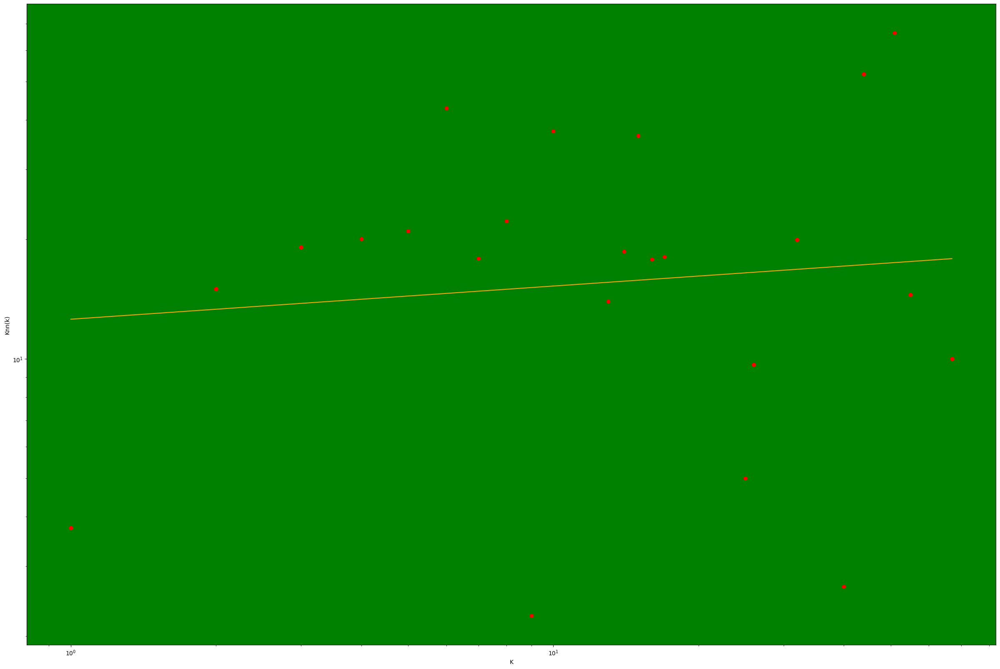

Correlation exponent and intercept:  0.08361572370182273 1.0999807144170588


In [ ]:
print('Degree correaltion between androgynous and female artists')
assortativity_in_two_groups(G,andy_artists,female_artists)

# Popularity wrt genre

In [ ]:
import pandas as pd
import itertools
from tqdm import tqdm
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns

In [ ]:
artist_link = pd.read_csv('Collaboration_links_w_genre.csv')
artist_link

,source,target,release_date,populairty
0,Robert Schumann,Vladimir Horowitz,1928,0
1,Frédéric Chopin,Vladimir Horowitz,1928,1
2,Felix Mendelssohn,Vladimir Horowitz,1928,0
3,Franz Liszt,Vladimir Horowitz,1928,0
4,Sergei Rachmaninoff,Vladimir Horowitz,1928,0
...,...,...,...,...
14855,Lil Tjay,Sheff G,2020,67
14856,Lil Tjay,Sleepy Hallow,2020,67
14857,Meek Mill,Roddy Ricch,2020,66
14858,Kygo,Oh Wonder,2020,70


In [ ]:
artist_node = pd.read_csv('Collaboration_nodes_w_genre.csv')

In [ ]:
artist_genre_dict = dict()

for index, row in artist_node.iterrows():
    artist_genre_dict[row['Id']] = row['filtered_genre']

In [ ]:
source_genre = []
target_genre = []

for index, row in artist_link.iterrows():
    source_genre.append(artist_genre_dict[row['source']])
    target_genre.append(artist_genre_dict[row['target']])
    
artist_link['source_genre'] = source_genre
artist_link['target_genre'] = target_genre

In [ ]:
artist_link

,source,target,release_date,populairty,source_genre,target_genre
0,Robert Schumann,Vladimir Horowitz,1928,0,Classical,Classical
1,Frédéric Chopin,Vladimir Horowitz,1928,1,Classical,Classical
2,Felix Mendelssohn,Vladimir Horowitz,1928,0,Classical,Classical
3,Franz Liszt,Vladimir Horowitz,1928,0,Classical,Classical
4,Sergei Rachmaninoff,Vladimir Horowitz,1928,0,Classical,Classical
...,...,...,...,...,...,...
14855,Lil Tjay,Sheff G,2020,67,Rap,Rap
14856,Lil Tjay,Sleepy Hallow,2020,67,Rap,Rap
14857,Meek Mill,Roddy Ricch,2020,66,Hip-hop,Rap
14858,Kygo,Oh Wonder,2020,70,EDM,Indie


In [ ]:
genres_list = ['Metal','Jazz','Pop','Country','Indie','Oldies','EDM','Classical','Rock','Hip-hop','Rap','R&B']
intra_list = []
inter_list = []

for genre in genres_list:
    
    artist_link_genre_genre = artist_link[artist_link['source_genre'].isin([genre])]
    artist_link_genre_genre  = artist_link_genre_genre [artist_link_genre_genre ['target_genre'].isin([genre])]
    intra_list.append(np.mean(artist_link_genre_genre['populairty'].tolist()))
    
    artist_link_genre = artist_link[artist_link['source_genre'].isin([genre])]
    artist_link_genre_other = artist_link_genre[~artist_link_genre['target_genre'].isin([genre])]
    artist_link_genre_1 = artist_link[artist_link['target_genre'].isin([genre])]
    artist_link_genre_other_1 = artist_link_genre_1[~artist_link_genre_1['source_genre'].isin([genre])]
    artist_link_genre_other_all = pd.concat([artist_link_genre_other,artist_link_genre_other_1]).drop_duplicates(subset=['source','target'])
    
    inter_list.append(np.mean(artist_link_genre_other_all['populairty'].tolist()))

c:\Users\Pooja Shoni\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\Pooja Shoni\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


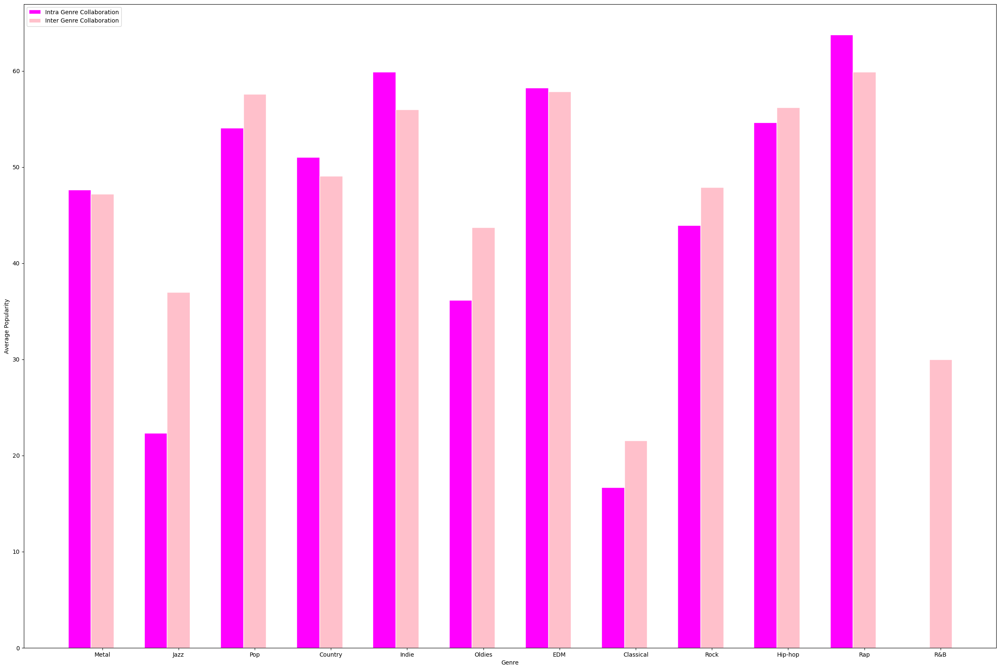

In [ ]:
barWidth = 0.30

intra = intra_list
inter = inter_list

r1 = np.arange(len(intra))
r2 = [x + barWidth for x in r1]

plt.figure(figsize=(30,20))

plt.bar(r1, intra, color='magenta', width=barWidth, edgecolor='white', label='Intra Genre Collaboration')
plt.bar(r2, inter, color='pink', width=barWidth, edgecolor='white', label='Inter Genre Collaboration')

plt.xlabel('Genre')
plt.ylabel('Average Popularity')
plt.xticks([r + barWidth for r in range(len(intra))], genres_list)

plt.legend()
plt.show()

In [ ]:
artist_link_classical_classical = artist_link[artist_link['source_genre'].isin(['Classical'])]
artist_link_classical_classical = artist_link_classical_classical['target_genre'].isin(['Classical'])

In [ ]:
artist_link_classical = artist_link[artist_link['source_genre'].isin(['Classical'])]
artist_link_classical_other = artist_link_classical[~artist_link_classical['target_genre'].isin(['Classical'])]
artist_link_classical_1 = artist_link[artist_link['target_genre'].isin(['Classical'])]
artist_link_classical_other_1 = artist_link_classical_1[~artist_link_classical_1['source_genre'].isin(['Classical'])]
artist_link_classical_other_all = pd.concat([artist_link_classical_other,artist_link_classical_other_1]).drop_duplicates(subset=['source','target'])

In [ ]:
print('Average popularity in classical-other collaboration: ', np.mean(artist_link_classical_other_all['populairty'].tolist()))

Average popularity in classical-other collaboration:  21.533088235294116


In [ ]:
artist_link_pop =artist_link[artist_link['source_genre'].isin(['Pop'])]
artist_link_pop_pop =artist_link_pop[artist_link_pop['target_genre'].isin(['Pop'])]

In [ ]:
print('Average popularity in pop-pop collaboration: ', np.mean(artist_link_pop_pop['populairty'].tolist()))

Average popularity in pop-pop collaboration:  54.05391527599487


In [ ]:
artist_link_pop = artist_link[artist_link['source_genre'].isin(['Pop'])]
artist_link_pop_other = artist_link_pop[~artist_link_pop['target_genre'].isin(['Pop'])]
artist_link_pop_1 = artist_link[artist_link['target_genre'].isin(['Pop'])]
artist_link_pop_other_1 = artist_link_pop_1[~artist_link_pop_1['source_genre'].isin(['Pop'])]
artist_link_pop_other_all = pd.concat([artist_link_pop_other,artist_link_pop_other_1]).drop_duplicates(subset=['source','target'])

In [ ]:
print('Average popularity in pop-other collaboration: ', np.mean(artist_link_pop_other_all['populairty'].tolist()))

Average popularity in pop-other collaboration:  57.60349854227405


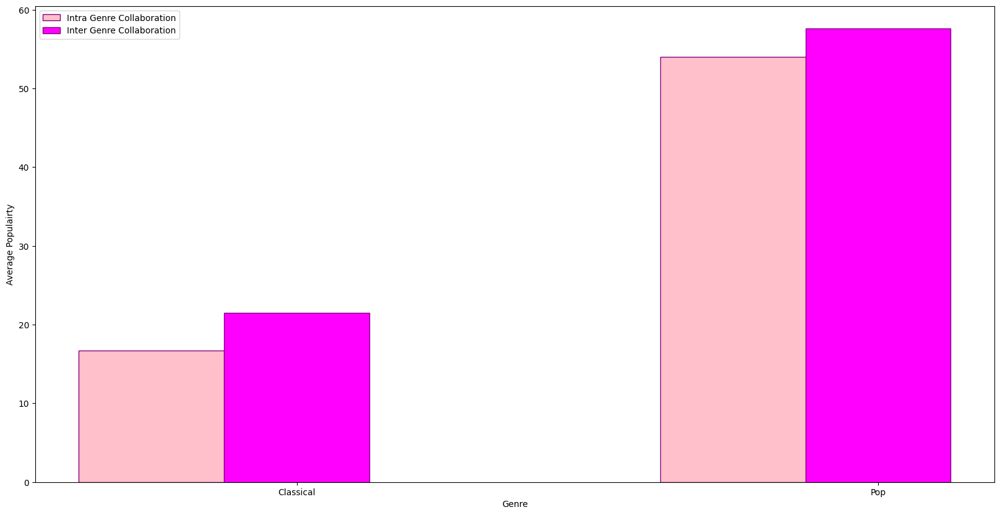

In [ ]:
barWidth = 0.25

intra = [16.7,54.0]
inter = [21.5,57.6]

r1 = np.arange(len(intra))
r2 = [x + barWidth for x in r1]

plt.figure(figsize=(20,10))

plt.bar(r1, intra, color='pink', width=barWidth, edgecolor='purple', label='Intra Genre Collaboration')
plt.bar(r2, inter, color='magenta', width=barWidth, edgecolor='purple', label='Inter Genre Collaboration')

plt.xlabel('Genre')
plt.ylabel('Average Populairty')
plt.xticks([r + barWidth for r in range(len(intra))], ['Classical','Pop'])

plt.legend()
plt.show()

In [ ]:
artist_genre = pd.read_csv('Collaboration_nodes_w_genre.csv')

In [ ]:
artist_link = pd.read_csv('Collaboration_links_w_genre.csv')
artist_link

,source,target,release_date,populairty
0,Robert Schumann,Vladimir Horowitz,1928,0
1,Frédéric Chopin,Vladimir Horowitz,1928,1
2,Felix Mendelssohn,Vladimir Horowitz,1928,0
3,Franz Liszt,Vladimir Horowitz,1928,0
4,Sergei Rachmaninoff,Vladimir Horowitz,1928,0
...,...,...,...,...
14855,Lil Tjay,Sheff G,2020,67
14856,Lil Tjay,Sleepy Hallow,2020,67
14857,Meek Mill,Roddy Ricch,2020,66
14858,Kygo,Oh Wonder,2020,70


In [ ]:
Graphtype = nx.Graph()
G = nx.from_pandas_edgelist(artist_link, create_using=Graphtype)

In [ ]:
popularity_dict = dict()

for index, row in artist_genre.iterrows():
    popularity_dict[row['Id']] = row['populairty']

In [ ]:
artist_degree_avg_neighbor_popularity_dict = dict()

for artist in popularity_dict.keys():
    artist_degree_avg_neighbor_popularity_dict[artist] = dict()
    artist_degree_avg_neighbor_popularity_dict[artist]['popularity'] = popularity_dict[artist]
    neighbors_of_artist = [n for n in G.neighbors(artist)]
    neighbor_popularity = []
    for neighbor in neighbors_of_artist:
        neighbor_popularity.append(popularity_dict[neighbor])
    artist_degree_avg_neighbor_popularity_dict[artist]['popularity_nn'] = np.mean(neighbor_popularity)

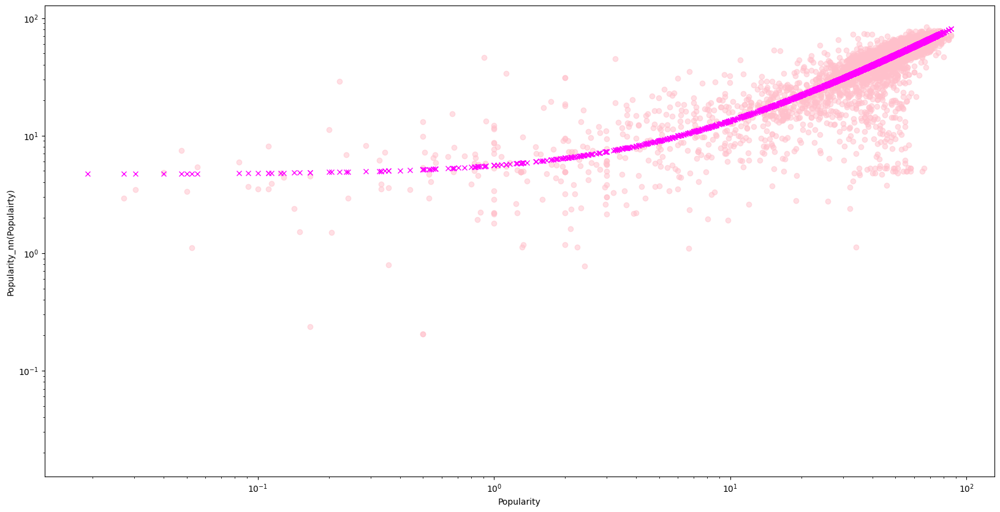

Correlation exponent and intercept:  0.0003213938554855346 0.8632447845229003 4.709394707678059


In [ ]:
popularity_list = []
popularity_nn_list = []

for artist in artist_degree_avg_neighbor_popularity_dict.keys():
    popularity_list.append(artist_degree_avg_neighbor_popularity_dict[artist]['popularity'])
    popularity_nn_list.append(artist_degree_avg_neighbor_popularity_dict[artist]['popularity_nn'])
    
plt.figure(figsize=(20, 10)) 

a = np.asarray(popularity_list, dtype=float)
b = np.asarray(popularity_nn_list, dtype=float)
coefficients = np.polyfit(a, b, 2)
polynomial = np.poly1d(coefficients)
ys = polynomial(a)
plt.loglog(a, b, 'o', alpha = 0.5,color='pink')
plt.loglog(a, ys, 'x',color=('magenta'))
plt.xlabel('Popularity')
plt.ylabel('Popularity_nn(Populairty)')
plt.show()

print('Correlation exponent and intercept: ', coefficients[0], coefficients[1], coefficients[2])

# Temporal analysis

In [ ]:
import pandas as pd
import itertools
from tqdm import tqdm
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

In [ ]:
artist_link = pd.read_csv('Collaboration_links_w_genre.csv')

In [ ]:
dinstinct_artists = list(set(artist_link['source'].tolist()).union(set(artist_link['target'].tolist())))

In [ ]:
artistyear_dict = dict()

for artist in tqdm(dinstinct_artists):
    years_list = []
    artist_in_source = artist_link[artist_link['source']==artist] 
    artist_in_target =artist_link[artist_link['target']==artist]
    for year in artist_in_source['release_date'].tolist():
        years_list.append(year)
    for year in artist_in_target['release_date'].tolist():
        years_list.append(year)
    artistyear_dict[artist] = years_list

100%|██████████| 5142/5142 [00:48<00:00, 106.60it/s]


In [ ]:
artistyear_dict

{'k.d. lang': [2002, 1992],
 'Rowdy Rebel': [2014, 2014, 2020],
 'Peter Cetera': [1986, 1992, 1998, 1987, 1989],
 'Karlheinz Zoeller': [1984, 1984, 1984],
 'Sam Feldt': [2020, 2019, 2019, 2020, 2015, 2015, 2018, 2018, 2019, 2019],
 'Adje': [2017, 2017],
 'Gemini': [2004, 2006],
 'Salvatore Accardo': [1983, 1986, 1986, 1990, 1983, 1983],
 'Arvo Pärt': [1993, 1999],
 'Ross Lynch': [2015, 2016, 2016],
 'OMI': [2015],
 'Jamie N Commons': [2014, 2014, 2020],
 'Michel Sénéchal': [1973,
  1973,
  1973,
  1973,
  1973,
  1973,
  1946,
  1973,
  1973,
  1946],
 'P-Lo': [2013, 2013, 2013, 2015, 2013],
 'Alexis Weissenberg': [1953],
 'Sugar T.': [1934],
 'C-Rayz Walz': [2003, 2003, 2003, 2003, 2003],
 'MCM Raymond': [2019],
 'Ray Barreto': [1968, 1968, 1968],
 'Sibelius': [1937],
 'Hussein Fatal': [2006, 2006, 2006],
 'NGHTMRE': [2016, 2017, 2017, 2016, 2015],
 'Jason Mraz': [2008, 2008, 2015, 2011],
 'Hook N Sling': [2020, 2020],
 'Jhay Cortez': [2018, 2020, 2020, 2018, 2018, 2018, 2018, 2018, 2

In [ ]:
artist_active_year_count = dict()

for artist in artistyear_dict.keys():
    artist_active_year_count[artist] = len(artistyear_dict[artist])

In [ ]:
artist_active_year_count_sorted = dict(sorted(artist_active_year_count.items(), reverse=True, key=lambda item: item[1]))

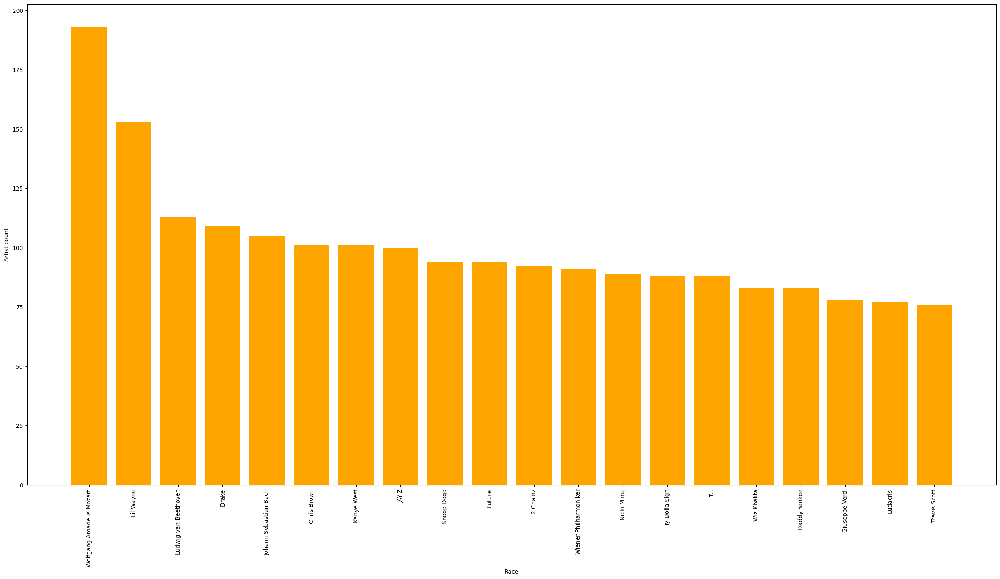

In [ ]:
plt.figure(figsize=(30,15))
plt.bar(list(artist_active_year_count_sorted.keys())[0:20], list(artist_active_year_count_sorted.values())[0:20], color='orange')
plt.xticks(rotation='vertical')
plt.ylabel('Artist count')
plt.xlabel('Race')
plt.show()

In [ ]:
artist_active_distinct_year_count = dict()

for artist in artistyear_dict.keys():
    artist_active_distinct_year_count[artist] = len(set(artistyear_dict[artist]))

In [ ]:
artist_active_distinct_year_count_sorted = dict(sorted(artist_active_distinct_year_count.items(), reverse=True, key=lambda item: item[1]))

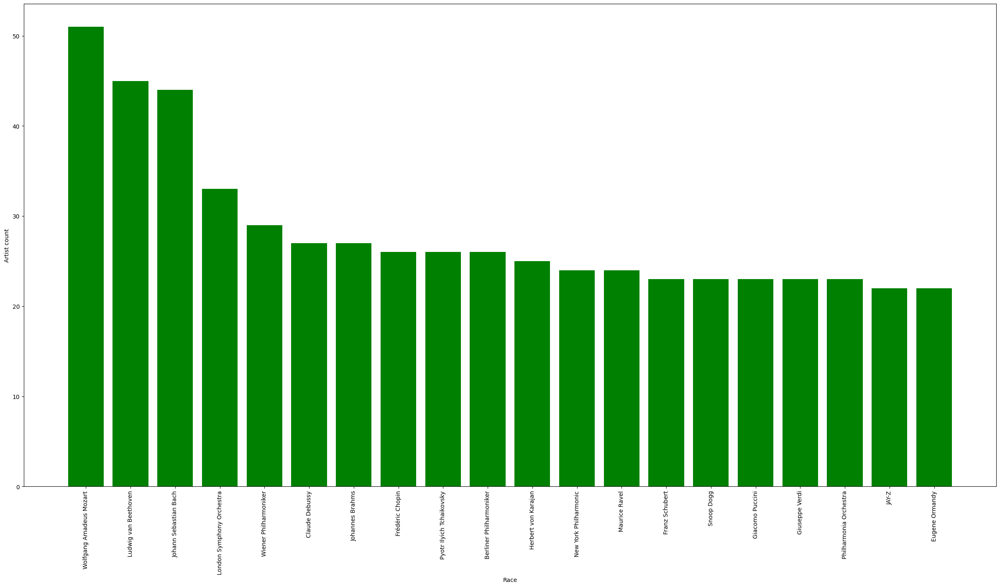

In [ ]:
plt.figure(figsize=(30,15))
plt.bar(list(artist_active_distinct_year_count_sorted.keys())[0:20], list(artist_active_distinct_year_count_sorted.values())[0:20], color='green')
plt.xticks(rotation='vertical')
plt.ylabel('Artist count')
plt.xlabel('Race')
plt.show()

In [ ]:
def temporal_collab(artistyear_dict,artist_link,artist):
    print('Worked between the years: ', min(artistyear_dict[artist]), max(artistyear_dict[artist]))
    distinct_years = set(artistyear_dict[artist])
    print('Total entries of years: ', len(artistyear_dict[artist]))
    print('Distinct entries of years: ', len(artistyear_dict[artist]))
    
    artist_link_artist = artist_link[artist_link['source'].isin([artist])]
    artist_link_artist =artist_link_artist[artist_link_artist['source'].isin([artist])]

    collab_number_year = []

    for year in distinct_years:
        collab_number_year.append(len(artist_link_artist[artist_link_artist['release_date']==year]))
        
    plt.figure(figsize=(30,20))
    plt.bar(list(distinct_years),collab_number_year,color='pink')
    plt.xticks(rotation='vertical')
    plt.ylabel('Collaboration count')
    plt.xlabel('Year')
    plt.show()
    
    return 

Worked between the years:  2006 2020
Total entries of years:  36
Distinct entries of years:  36


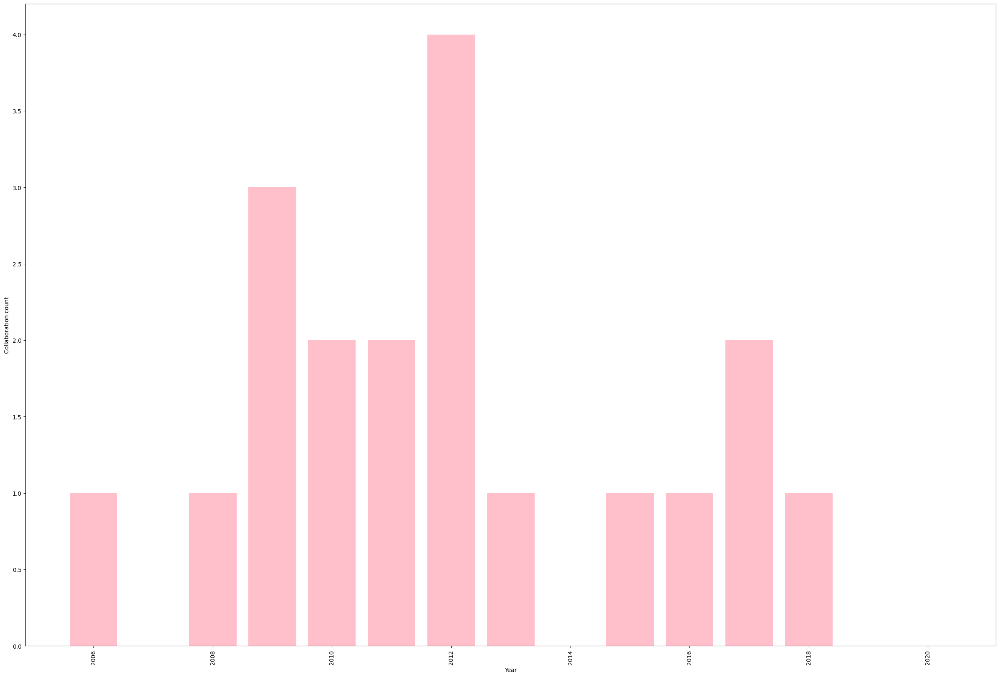

In [ ]:
temporal_collab(artistyear_dict,artist_link,'Rihanna')

Worked between the years:  2005 2020
Total entries of years:  101
Distinct entries of years:  101


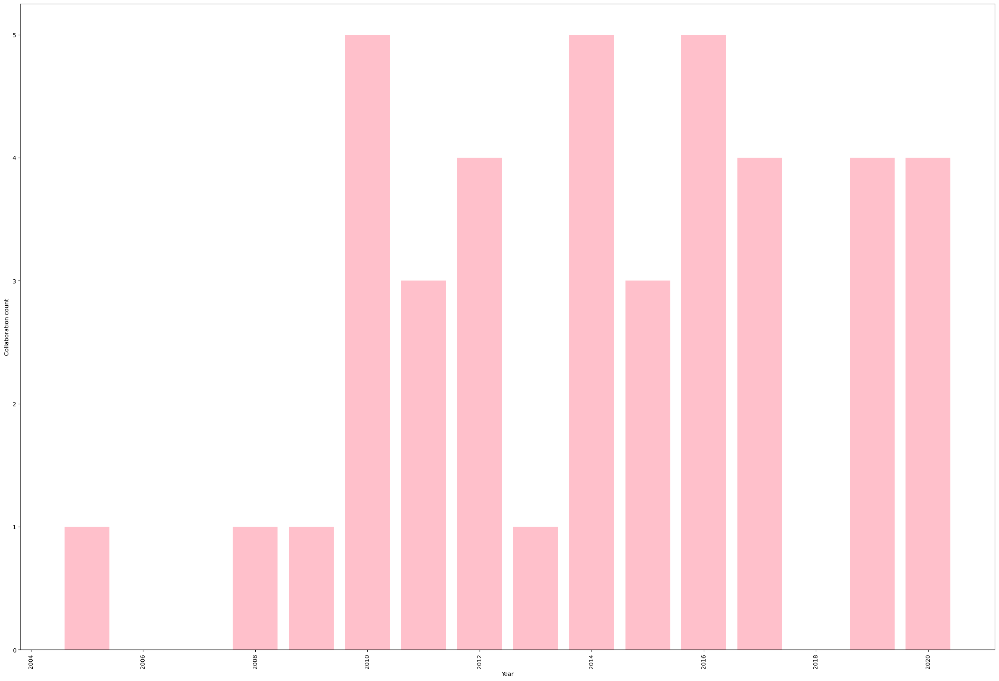

In [ ]:
temporal_collab(artistyear_dict,artist_link,'Chris Brown')

Worked between the years:  2011 2020
Total entries of years:  32
Distinct entries of years:  32


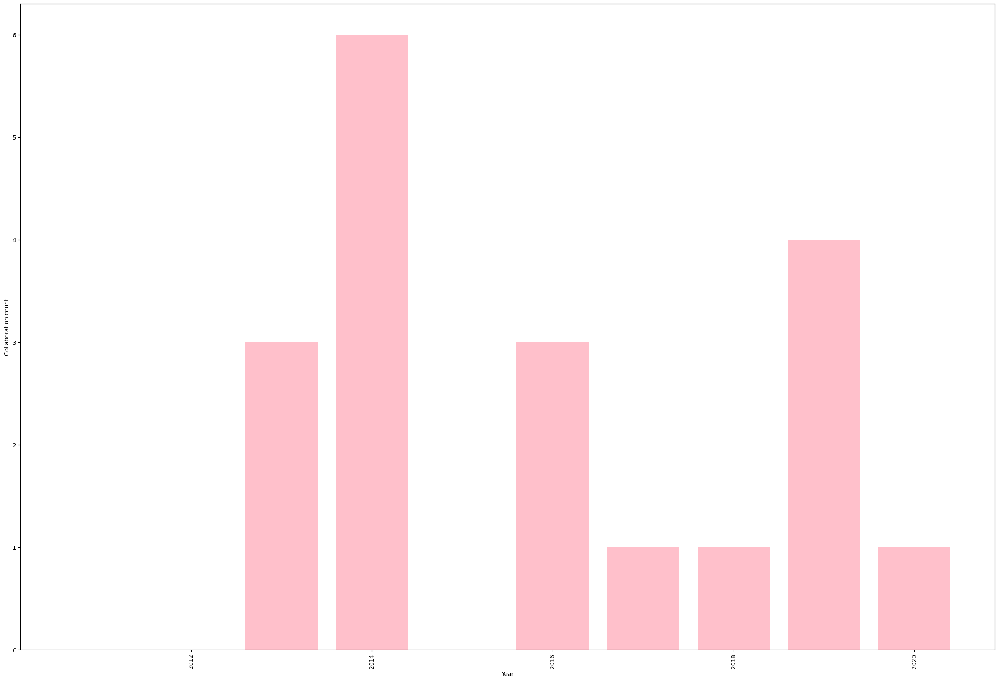

In [ ]:
temporal_collab(artistyear_dict,artist_link,'Ariana Grande')